<a href="https://colab.research.google.com/github/WIEM-MOOT-HAD/seasame_ouvre_toi/blob/main/sesame_ouvre_toi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Remarques suite point: 
- prendre le target "Decile Score"
- quand faire les graphs, faire groupby sur le "Person_ID"
- Faire un graphique avec 3 dimensions: risk, ethnie, sex
- a tester: regression pour prédire le score puis faire la classification, ou faire la classification sur le risk

#### Import Librairies dans datasets

In [ ]:
#import librairies
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import plotly.graph_objs as go
import seaborn as sns

In [ ]:
#model autoML
#https://pycaret.org/

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#import datasets

data1 = pd.read_csv("/content/drive/MyDrive/Sesame_ouvre_toi/data/compas-scores-raw.csv")
data2 = pd.read_csv("/content/drive/MyDrive/Sesame_ouvre_toi/data/cox-violent-parsed.csv")
data3 = pd.read_csv("/content/drive/MyDrive/Sesame_ouvre_toi/data/cox-violent-parsed_filt.csv")
data4 = pd.read_csv("/content/drive/MyDrive/Sesame_ouvre_toi/data/propublicaCompassRecividism_data_fairml.csv/propublica_data_for_fairml.csv")

#### Analyse 1st dataset

In [ ]:
data1.head()

,Person_ID,Agency_Text,Sex_Code_Text,Ethnic_Code_Text,DateOfBirth,ScaleSet,AssessmentReason,Language,LegalStatus,CustodyStatus,...,Screening_Date,RecSupervisionLevel,RecSupervisionLevelText,DisplayText,RawScore,DecileScore,ScoreText,AssessmentType,IsCompleted,IsDeleted
0,50844,PRETRIAL,Male,Caucasian,12/05/92,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Violence,-2.08,4,Low,New,1,0
1,50844,PRETRIAL,Male,Caucasian,12/05/92,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Recidivism,-1.06,2,Low,New,1,0
2,50844,PRETRIAL,Male,Caucasian,12/05/92,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Failure to Appear,15.00,1,Low,New,1,0
3,50848,PRETRIAL,Male,Caucasian,09/16/84,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Violence,-2.84,2,Low,New,1,0
4,50848,PRETRIAL,Male,Caucasian,09/16/84,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Recidivism,-1.50,1,Low,New,1,0


In [ ]:
data1["CustodyStatus"].value_counts()

Jail Inmate            30129
Probation              22968
Pretrial Defendant      7644
Residential Program       66
Parole                    21
Prison Inmate             15
Name: CustodyStatus, dtype: int64

In [ ]:
data1["Person_ID"=="12368"][""]

0        50844
1        50844
2        50844
3        50848
4        50848
         ...  
60838    65667
60839    65667
60840    68603
60841    68603
60842    68603
Name: Person_ID, Length: 60843, dtype: int64

In [ ]:
data1["Person_ID"].value_counts()

12368    12
51612    12
56551    12
44921    12
51415    12
         ..
49427     3
46271     3
48935     3
1126      3
68603     3
Name: Person_ID, Length: 18610, dtype: int64

In [ ]:
data1.describe()

,Person_ID,AssessmentID,Case_ID,ScaleSet_ID,RecSupervisionLevel,Scale_ID,RawScore,DecileScore,IsCompleted,IsDeleted
count,60843.000000,60843.000000,60843.000000,60843.000000,60843.000000,60843.000000,60843.000000,60843.000000,60843.0,60843.0
mean,53683.206154,68061.029190,60209.128149,21.819536,1.630048,11.000000,5.081457,3.571701,1.0,0.0
std,14363.648515,7320.208226,9638.501654,0.932614,0.944220,4.966596,10.080518,2.617854,0.0,0.0
min,656.000000,649.000000,350.000000,17.000000,1.000000,7.000000,-4.790000,-1.000000,1.0,0.0
25%,52039.000000,62582.000000,56021.000000,22.000000,1.000000,7.000000,-2.090000,1.000000,1.0,0.0
50%,57321.000000,68229.000000,61261.000000,22.000000,1.000000,8.000000,-0.710000,3.000000,1.0,0.0
75%,62748.000000,73870.000000,66554.000000,22.000000,2.000000,18.000000,14.000000,5.000000,1.0,0.0
max,68608.000000,79678.000000,72045.000000,22.000000,4.000000,18.000000,51.000000,10.000000,1.0,0.0


In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60843 entries, 0 to 60842
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Person_ID                60843 non-null  int64  
 1   AssessmentID             60843 non-null  int64  
 2   Case_ID                  60843 non-null  int64  
 3   Agency_Text              60843 non-null  object 
 4   LastName                 60843 non-null  object 
 5   FirstName                60843 non-null  object 
 6   MiddleName               15648 non-null  object 
 7   Sex_Code_Text            60843 non-null  object 
 8   Ethnic_Code_Text         60843 non-null  object 
 9   DateOfBirth              60843 non-null  object 
 10  ScaleSet_ID              60843 non-null  int64  
 11  ScaleSet                 60843 non-null  object 
 12  AssessmentReason         60843 non-null  object 
 13  Language                 60843 non-null  object 
 14  LegalStatus           

In [ ]:
data1.isnull().sum().sum()

45240

<Axes: >

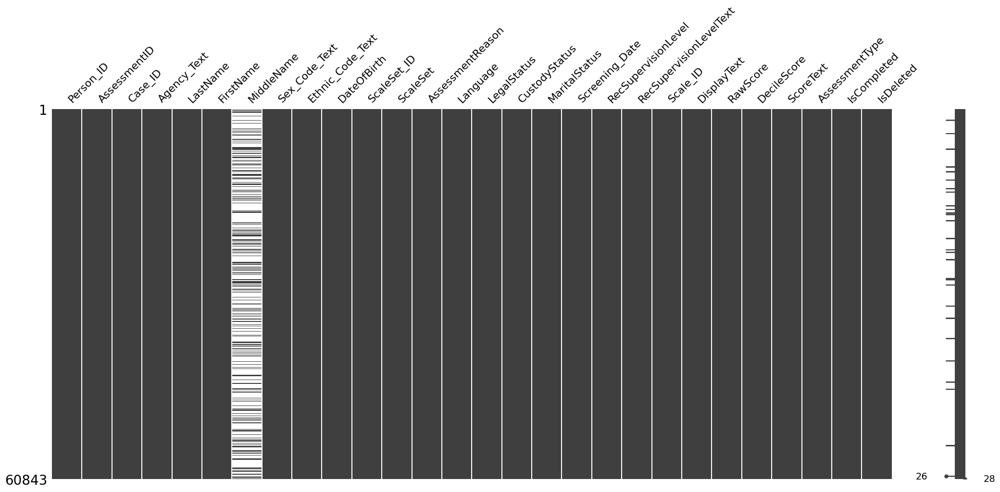

In [ ]:
msno.matrix(data1)

In [ ]:
data1.drop(['AssessmentID', 'Case_ID','LastName','FirstName', 'MiddleName', 'ScaleSet_ID','Scale_ID'],
           axis=1, inplace=True)

In [ ]:
data1.head()

,Person_ID,Agency_Text,Sex_Code_Text,Ethnic_Code_Text,DateOfBirth,ScaleSet,AssessmentReason,Language,LegalStatus,CustodyStatus,...,Screening_Date,RecSupervisionLevel,RecSupervisionLevelText,DisplayText,RawScore,DecileScore,ScoreText,AssessmentType,IsCompleted,IsDeleted
0,50844,PRETRIAL,Male,Caucasian,12/05/92,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Violence,-2.08,4,Low,New,1,0
1,50844,PRETRIAL,Male,Caucasian,12/05/92,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Recidivism,-1.06,2,Low,New,1,0
2,50844,PRETRIAL,Male,Caucasian,12/05/92,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Failure to Appear,15.00,1,Low,New,1,0
3,50848,PRETRIAL,Male,Caucasian,09/16/84,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Violence,-2.84,2,Low,New,1,0
4,50848,PRETRIAL,Male,Caucasian,09/16/84,Risk and Prescreen,Intake,English,Pretrial,Jail Inmate,...,1/1/13 0:00,1,Low,Risk of Recidivism,-1.50,1,Low,New,1,0


<Axes: >

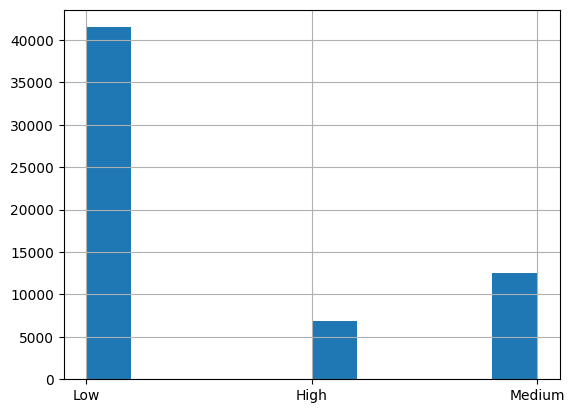

In [ ]:
data1["ScoreText"].hist()

In [ ]:
categorical_columns = ['MaritalStatus','Agency_Text', 'Sex_Code_Text', 'Ethnic_Code_Text', 'ScaleSet', 'AssessmentReason', 'Language', 'LegalStatus', 
           'CustodyStatus', 'RecSupervisionLevel', 'RecSupervisionLevelText', 'DisplayText', 'DecileScore', 'AssessmentType',
          'IsCompleted', 'IsDeleted', 'ScoreText' ]
for col in categorical_columns: 
  print("******************")
  print(col)
  print(data1[col].value_counts())

******************
MaritalStatus
Single               45126
Married               8172
Divorced              3879
Separated             1803
Significant Other     1260
Widowed                390
Unknown                213
Name: MaritalStatus, dtype: int64
******************
Agency_Text
PRETRIAL          41100
Probation         19056
DRRD                564
Broward County      123
Name: Agency_Text, dtype: int64
******************
Sex_Code_Text
Male      47514
Female    13329
Name: Sex_Code_Text, dtype: int64
******************
Ethnic_Code_Text
African-American    27018
Caucasian           21783
Hispanic             8742
Other                2592
Asian                 324
Native American       219
Arabic                 75
African-Am             51
Oriental               39
Name: Ethnic_Code_Text, dtype: int64
******************
ScaleSet
Risk and Prescreen    58647
All Scales             2196
Name: ScaleSet, dtype: int64
******************
AssessmentReason
Intake    60843
Name: Assessme

******************* MaritalStatus **************************


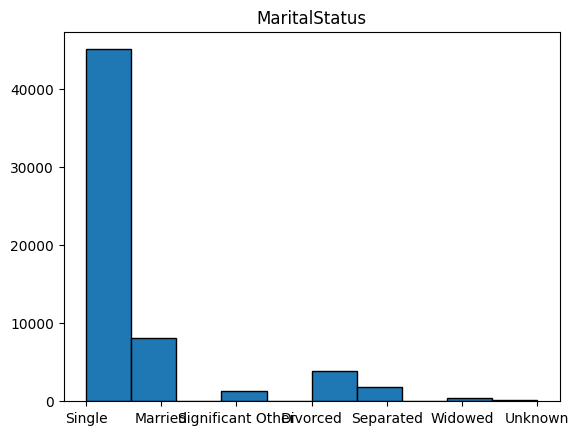

<Figure size 1000x1000 with 0 Axes>

******************* Agency_Text **************************


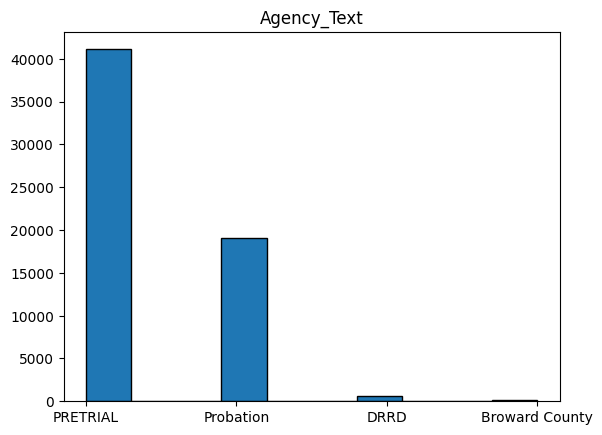

<Figure size 1000x1000 with 0 Axes>

******************* Sex_Code_Text **************************


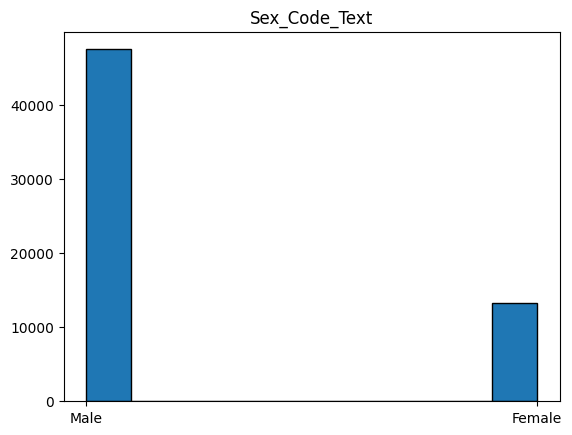

<Figure size 1000x1000 with 0 Axes>

******************* Ethnic_Code_Text **************************


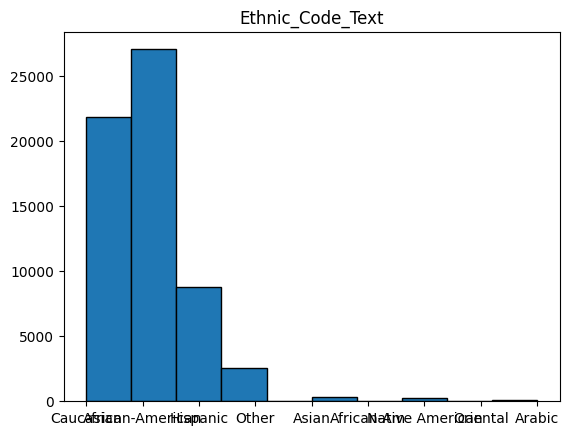

<Figure size 1000x1000 with 0 Axes>

******************* ScaleSet **************************


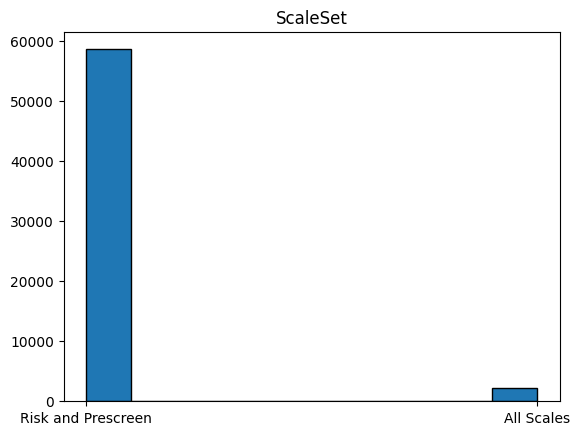

<Figure size 1000x1000 with 0 Axes>

******************* AssessmentReason **************************


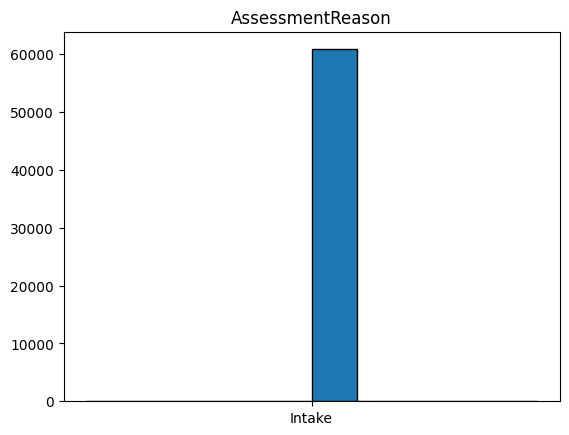

<Figure size 1000x1000 with 0 Axes>

******************* Language **************************


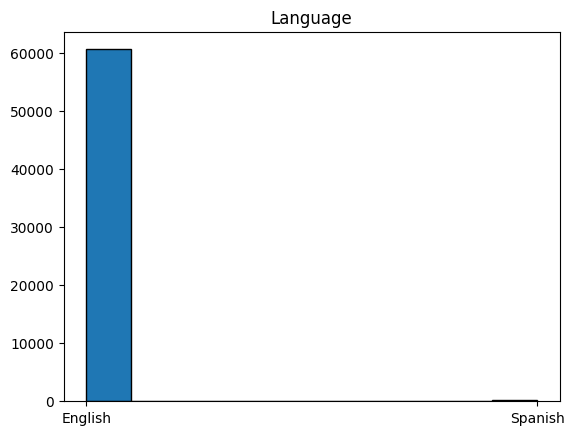

<Figure size 1000x1000 with 0 Axes>

******************* LegalStatus **************************


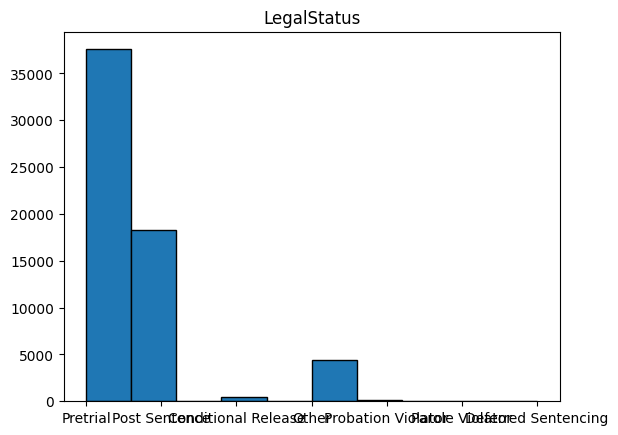

<Figure size 1000x1000 with 0 Axes>

******************* CustodyStatus **************************


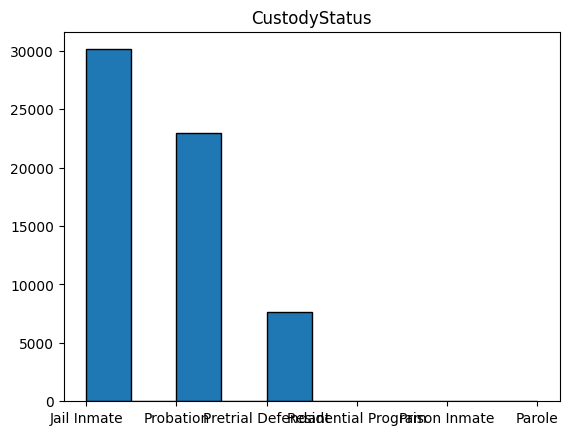

<Figure size 1000x1000 with 0 Axes>

******************* RecSupervisionLevel **************************


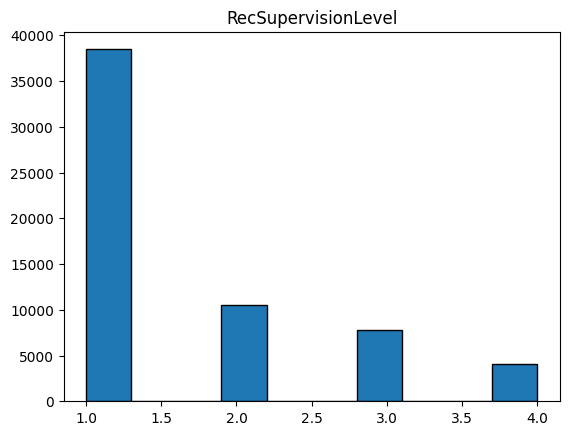

<Figure size 1000x1000 with 0 Axes>

******************* RecSupervisionLevelText **************************


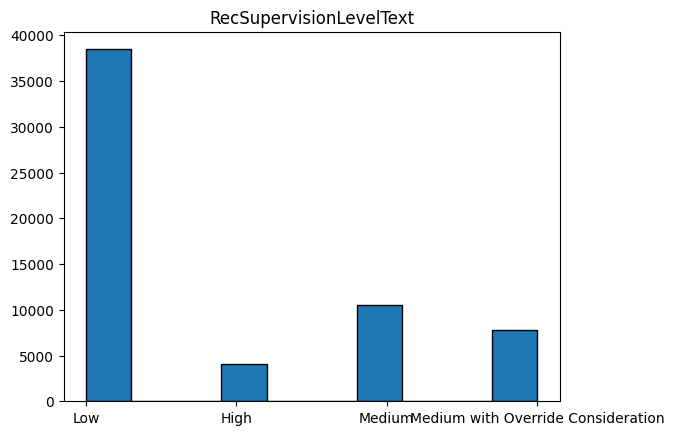

<Figure size 1000x1000 with 0 Axes>

******************* DisplayText **************************


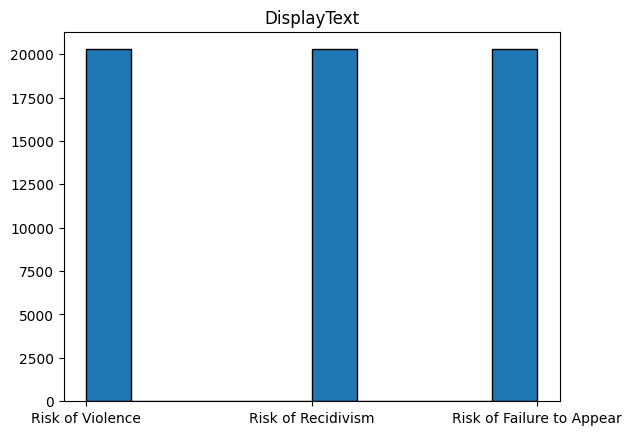

<Figure size 1000x1000 with 0 Axes>

******************* DecileScore **************************


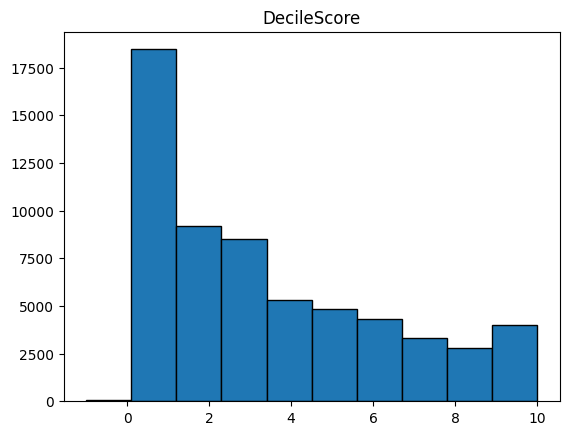

<Figure size 1000x1000 with 0 Axes>

******************* AssessmentType **************************


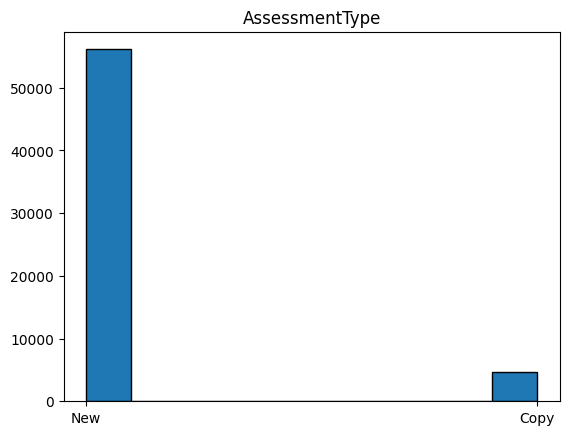

<Figure size 1000x1000 with 0 Axes>

******************* IsCompleted **************************


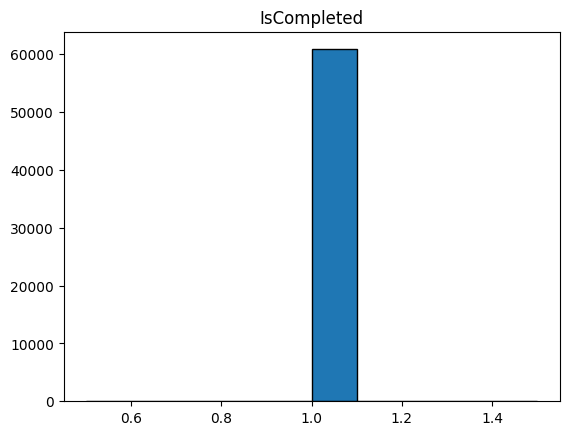

<Figure size 1000x1000 with 0 Axes>

******************* IsDeleted **************************


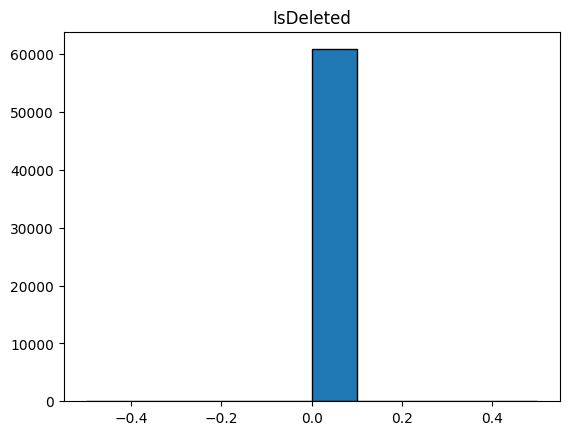

<Figure size 1000x1000 with 0 Axes>

In [ ]:
for col in categorical_columns[:-1]:
  print("*******************",col,"**************************")
  plt.hist(data1[col], edgecolor='black')
  plt.title(col)
  figure(figsize=(10,10))
  plt.show()

In [ ]:
for col in categorical_columns:
  trace = go.Histogram(x=data1[col], nbinsx=5)
  layout = go.Layout(title= col, xaxis_title= col, yaxis_title= "count" )
  fig = go.Figure(data=[trace], layout=layout)
  fig.show()

In [ ]:
columns = data1.columns

In [ ]:
data1['Ethnic_Code_Text'].replace('African-Am','African-American')
data1['Ethnic_Code_Text'].replace('Arabic','Arabic-Oriental')
data1['Ethnic_Code_Text'].replace('Oriental','Arabic-Oriental').value_counts()

African-American    27018
Caucasian           21783
Hispanic             8742
Other                2592
Asian                 324
Native American       219
Arabic                 75
African-Am             51
Arabic-Oriental        39
Name: Ethnic_Code_Text, dtype: int64

In [ ]:
data1["DecileScore"].value_counts()

 1     18465
 2      9192
 3      8492
 4      5338
 5      4831
 6      4319
 7      3338
 8      2799
 9      2386
 10     1638
-1        45
Name: DecileScore, dtype: int64

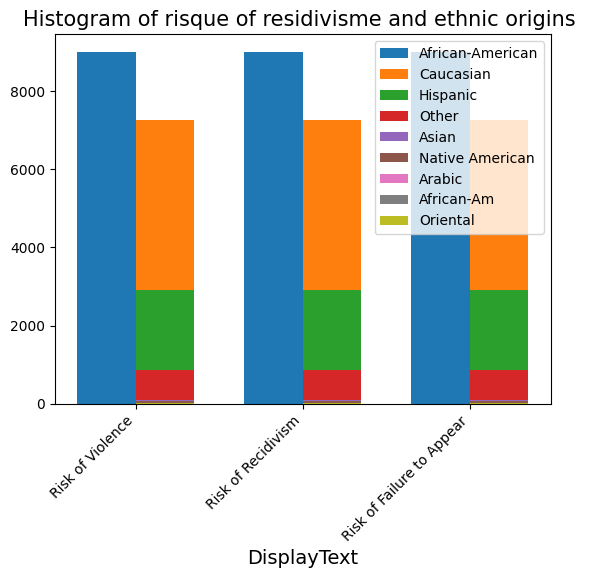

In [ ]:
ethnic = data1.groupby('Ethnic_Code_Text')
c_african_american= ethnic.get_group('African-American')['DisplayText'].value_counts()
c_caucasian= ethnic.get_group('Caucasian')['DisplayText'].value_counts()
c_hispanic= ethnic.get_group('Hispanic')['DisplayText'].value_counts()
c_other= ethnic.get_group('Other')['DisplayText'].value_counts()
c_asian= ethnic.get_group('Asian')['DisplayText'].value_counts()
c_native_american = ethnic.get_group('Native American')['DisplayText'].value_counts()
c_arabic = ethnic.get_group('Arabic')['DisplayText'].value_counts()
c_African_Am = ethnic.get_group('African-Am')['DisplayText'].value_counts()
c_oriental = ethnic.get_group('Oriental')['DisplayText'].value_counts()


hairpat = data1['DisplayText'].value_counts().index
ethnic_code = data1['Ethnic_Code_Text'].value_counts().index
pos = np.arange(len(hairpat))
width = 0.35  # épaisseur de chaque bâton

# Création du diagramme en bâtons (bâtons côte à côte)
plt.bar(pos - width/2, c_african_american, width)
plt.bar(pos + width/2,c_caucasian, width)
plt.bar(pos + width/2,c_hispanic, width,)
plt.bar(pos + width/2,c_other, width)
plt.bar(pos + width/2,c_asian, width)
plt.bar(pos + width/2,c_native_american, width)
plt.bar(pos + width/2,c_arabic, width)
plt.bar(pos + width/2,c_African_Am, width)
plt.bar(pos + width/2,c_oriental, width)

#plt.xticks(pos, hairpat)
plt.xticks(pos, hairpat, rotation=45, ha="right")

plt.xlabel('DisplayText', fontsize=14)
plt.title('Histogram of risque of residivisme and ethnic origins ',fontsize=15)
plt.legend(ethnic_code,loc=1)
plt.show()

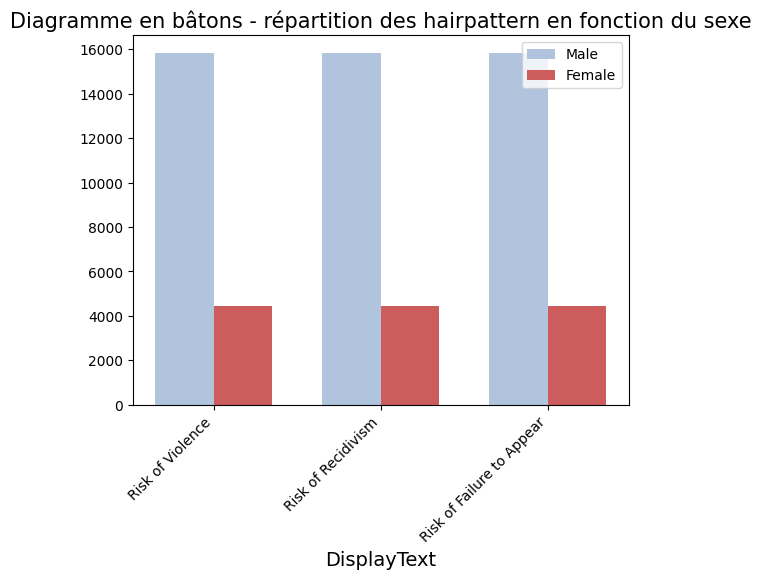

In [ ]:
# Création du groupe "sex", et décompte des individus de chaque sous-grouê (male, female)
g = data1.groupby('Sex_Code_Text')
c_female = g.get_group('Female')['DisplayText'].value_counts()
c_male = g.get_group('Male')['DisplayText'].value_counts()

# On extrait les noms des différents hairpattern et des différents sexes
hairpat = data1['DisplayText'].value_counts().index
gender = data1['Sex_Code_Text'].value_counts().index
pos = np.arange(len(hairpat))
width = 0.35  # épaisseur de chaque bâton

# Création du diagramme en bâtons (bâtons côte à côte)
plt.bar(pos - width/2, c_male, width, color='lightsteelblue')
plt.bar(pos + width/2,c_female, width, color='IndianRed')
#plt.xticks(pos, hairpat)
plt.xticks(pos, hairpat, rotation=45, ha="right")

plt.xlabel('DisplayText', fontsize=14)
plt.title('Diagramme en bâtons - répartition des hairpattern en fonction du sexe',fontsize=15)
plt.legend(gender,loc=1)
plt.show()

In [ ]:
continue_columns=[]
for i in columns: 
  if i not in categorical_columns: 
    continue_columns.append(i)

#### Analyse 2nd dataset


In [ ]:
data2.head(3)

,id,name,first,last,compas_screening_date,sex,dob,age,age_cat,race,...,v_type_of_assessment,v_decile_score,v_score_text,v_screening_date,in_custody,out_custody,priors_count.1,start,end,event
0,1.0,miguel hernandez,miguel,hernandez,14/08/2013,Male,18/04/1947,69,Greater than 45,Other,...,Risk of Violence,1,Low,14/08/2013,07/07/2014,14/07/2014,0,0,327,0
1,2.0,miguel hernandez,miguel,hernandez,14/08/2013,Male,18/04/1947,69,Greater than 45,Other,...,Risk of Violence,1,Low,14/08/2013,07/07/2014,14/07/2014,0,334,961,0
2,3.0,michael ryan,michael,ryan,31/12/2014,Male,06/02/1985,31,25 - 45,Caucasian,...,Risk of Violence,2,Low,31/12/2014,30/12/2014,03/01/2015,0,3,457,0


In [ ]:
data2.describe()

,id,age,juv_fel_count,decile_score,juv_misd_count,juv_other_count,priors_count,days_b_screening_arrest,c_days_from_compas,is_recid,r_days_from_arrest,violent_recid,is_violent_recid,decile_score.1,v_decile_score,priors_count.1,start,end,event
count,11001.00000,18316.000000,18316.000000,18316.000000,18316.000000,18316.000000,18316.000000,17019.000000,17449.000000,18316.000000,6359.000000,0.0,18316.000000,18316.000000,18316.000000,18316.000000,18316.000000,18316.000000,18316.000000
mean,5501.00000,34.019273,0.076873,4.997052,0.098439,0.124263,3.913191,4.302485,57.694596,0.414774,19.961629,NaN,0.073105,4.997052,4.022822,3.913191,186.394901,625.210636,0.044715
std,3175.85949,11.667811,0.464272,2.937569,0.517639,0.524537,5.299864,81.159881,317.994694,0.576449,74.139695,NaN,0.260317,2.937569,2.614189,5.299864,283.373004,335.881439,0.206683
min,1.00000,18.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,-597.000000,0.000000,-1.000000,-1.000000,NaN,0.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000
25%,2751.00000,25.000000,0.000000,2.000000,0.000000,0.000000,0.000000,-1.000000,1.000000,0.000000,0.000000,NaN,0.000000,2.000000,2.000000,0.000000,0.000000,364.000000,0.000000
50%,5501.00000,31.000000,0.000000,5.000000,0.000000,0.000000,2.000000,-1.000000,1.000000,0.000000,0.000000,NaN,0.000000,5.000000,4.000000,2.000000,7.000000,634.000000,0.000000
75%,8251.00000,41.000000,0.000000,8.000000,0.000000,0.000000,5.000000,0.000000,2.000000,1.000000,1.000000,NaN,0.000000,8.000000,6.000000,5.000000,309.000000,897.000000,0.000000
max,11001.00000,96.000000,20.000000,10.000000,13.000000,17.000000,43.000000,1057.000000,9485.000000,1.000000,993.000000,NaN,1.000000,10.000000,10.000000,43.000000,1197.000000,1187.000000,1.000000


In [ ]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18316 entries, 0 to 18315
Data columns (total 52 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       11001 non-null  float64
 1   name                     18316 non-null  object 
 2   first                    18316 non-null  object 
 3   last                     18316 non-null  object 
 4   compas_screening_date    18316 non-null  object 
 5   sex                      18316 non-null  object 
 6   dob                      18316 non-null  object 
 7   age                      18316 non-null  int64  
 8   age_cat                  18316 non-null  object 
 9   race                     18316 non-null  object 
 10  juv_fel_count            18316 non-null  int64  
 11  decile_score             18316 non-null  int64  
 12  juv_misd_count           18316 non-null  int64  
 13  juv_other_count          18316 non-null  int64  
 14  priors_count          

In [ ]:
data2.columns

Index(['id', 'name', 'first', 'last', 'compas_screening_date', 'sex', 'dob',
       'age', 'age_cat', 'race', 'juv_fel_count', 'decile_score',
       'juv_misd_count', 'juv_other_count', 'priors_count',
       'days_b_screening_arrest', 'c_jail_in', 'c_jail_out', 'c_case_number',
       'c_offense_date', 'c_arrest_date', 'c_days_from_compas',
       'c_charge_degree', 'c_charge_desc', 'is_recid', 'r_case_number',
       'r_charge_degree', 'r_days_from_arrest', 'r_offense_date',
       'r_charge_desc', 'r_jail_in', 'r_jail_out', 'violent_recid',
       'is_violent_recid', 'vr_case_number', 'vr_charge_degree',
       'vr_offense_date', 'vr_charge_desc', 'type_of_assessment',
       'decile_score.1', 'score_text', 'screening_date',
       'v_type_of_assessment', 'v_decile_score', 'v_score_text',
       'v_screening_date', 'in_custody', 'out_custody', 'priors_count.1',
       'start', 'end', 'event'],
      dtype='object')

<Axes: >

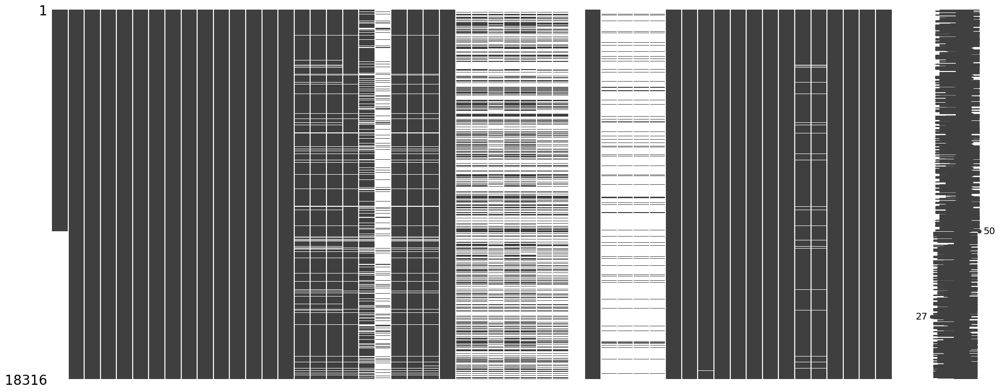

In [ ]:
msno.matrix(data2)

In [ ]:
data2.drop(['name','first','last','age', 'c_case_number', 'r_case_number','vr_case_number','violent_recid'],
           axis=1, inplace=True)

In [ ]:
for col in data2.columns: 
  print("******************")
  print(col)
  print(data2[col].value_counts())

******************
id
1.0        1
7338.0     1
7330.0     1
7331.0     1
7332.0     1
          ..
3670.0     1
3671.0     1
3672.0     1
3673.0     1
11001.0    1
Name: id, Length: 11001, dtype: int64
******************
compas_screening_date
20/03/2013    72
07/02/2013    68
20/04/2013    68
12/11/2014    67
14/02/2013    65
              ..
31/05/2013     2
20/06/2013     2
30/07/2013     2
03/07/2013     1
09/08/2014     1
Name: compas_screening_date, Length: 703, dtype: int64
******************
sex
Male      14933
Female     3383
Name: sex, dtype: int64
******************
dob
21/11/1991    21
10/11/1988    17
13/08/1994    15
28/04/1992    15
16/10/1983    14
              ..
21/06/1965     1
01/02/1981     1
30/07/1985     1
05/06/1994     1
17/11/1982     1
Name: dob, Length: 7485, dtype: int64
******************
age_cat
25 - 45            10372
Less than 25        4283
Greater than 45     3661
Name: age_cat, dtype: int64
******************
race
African-American    9791
Caucasia

In [ ]:
data2.columns

Index(['id', 'compas_screening_date', 'sex', 'dob', 'age_cat', 'race',
       'juv_fel_count', 'decile_score', 'juv_misd_count', 'juv_other_count',
       'priors_count', 'days_b_screening_arrest', 'c_jail_in', 'c_jail_out',
       'c_offense_date', 'c_arrest_date', 'c_days_from_compas',
       'c_charge_degree', 'c_charge_desc', 'is_recid', 'r_charge_degree',
       'r_days_from_arrest', 'r_offense_date', 'r_charge_desc', 'r_jail_in',
       'r_jail_out', 'is_violent_recid', 'vr_charge_degree', 'vr_offense_date',
       'vr_charge_desc', 'type_of_assessment', 'decile_score.1', 'score_text',
       'screening_date', 'v_type_of_assessment', 'v_decile_score',
       'v_score_text', 'v_screening_date', 'in_custody', 'out_custody',
       'priors_count.1', 'start', 'end', 'event'],
      dtype='object')

<Axes: >

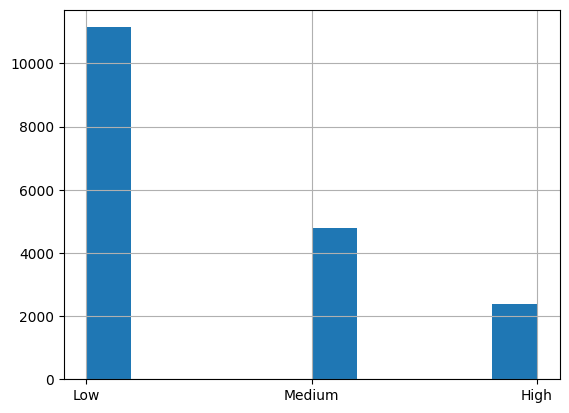

In [ ]:
data2["v_score_text"].hist()

In [ ]:
categorical_columns_data2 = ['sex', 'dob', 'age_cat', 'race',
       'juv_fel_count', 'decile_score', 'juv_misd_count', 'juv_other_count',
       'priors_count', 'days_b_screening_arrest',
       'c_days_from_compas', 'is_recid','r_days_from_arrest',
       'is_violent_recid', 'type_of_assessment',
       'decile_score.1', 'v_type_of_assessment', 'v_decile_score',
       'priors_count.1','start', 'end', 'event']

******************* sex **************************


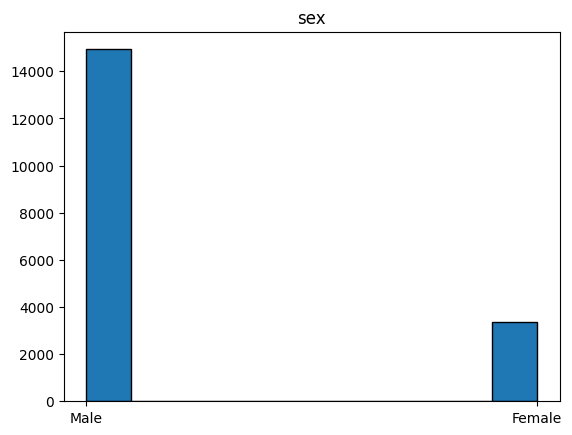

<Figure size 1000x1000 with 0 Axes>

******************* dob **************************


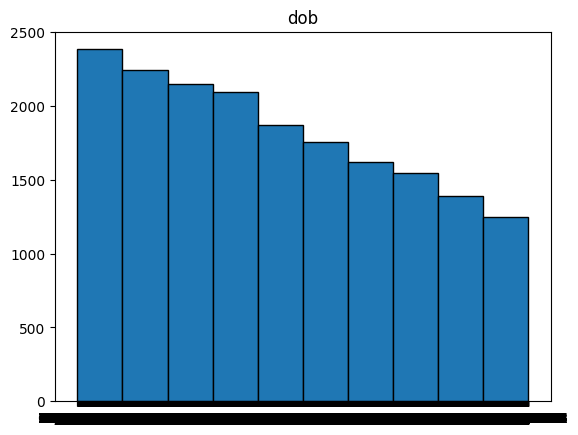

<Figure size 1000x1000 with 0 Axes>

******************* age_cat **************************


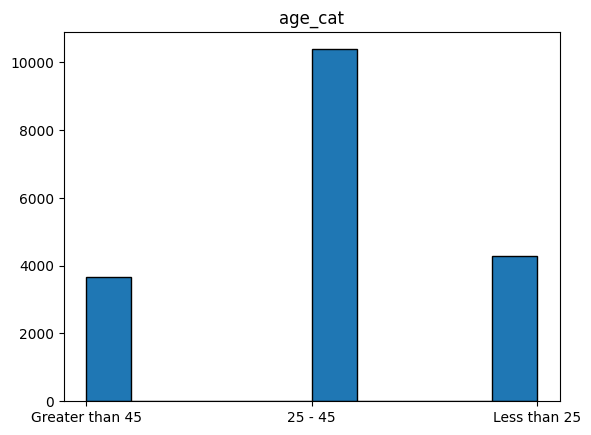

<Figure size 1000x1000 with 0 Axes>

******************* race **************************


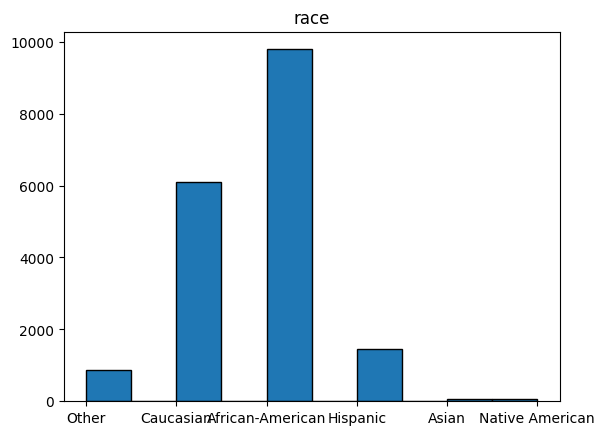

<Figure size 1000x1000 with 0 Axes>

******************* juv_fel_count **************************


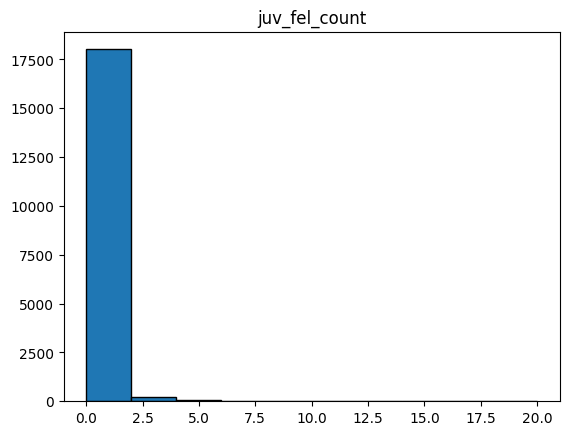

<Figure size 1000x1000 with 0 Axes>

******************* decile_score **************************


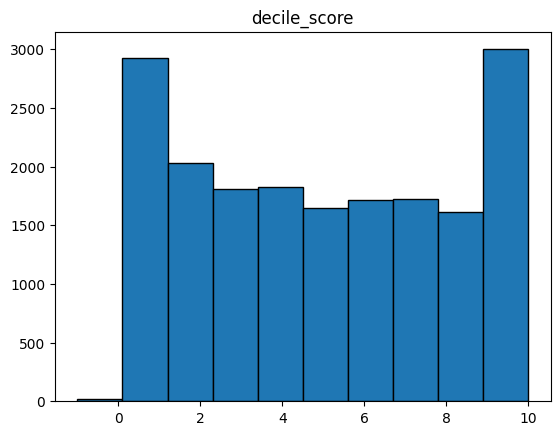

<Figure size 1000x1000 with 0 Axes>

******************* juv_misd_count **************************


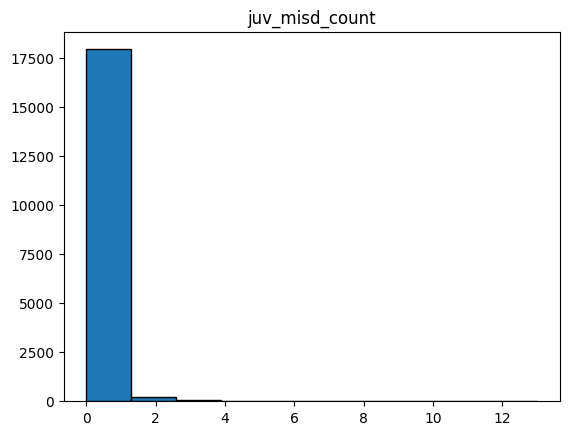

<Figure size 1000x1000 with 0 Axes>

******************* juv_other_count **************************


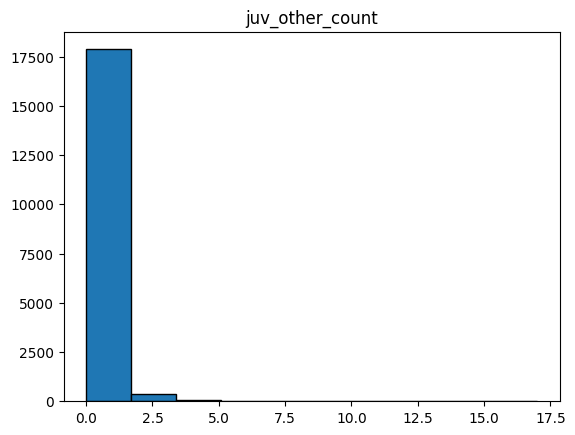

<Figure size 1000x1000 with 0 Axes>

******************* priors_count **************************


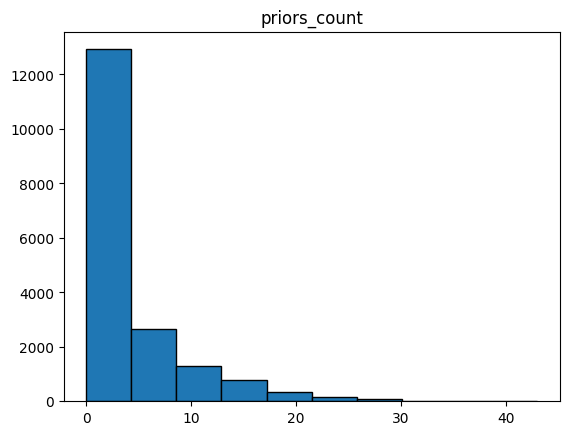

<Figure size 1000x1000 with 0 Axes>

******************* days_b_screening_arrest **************************


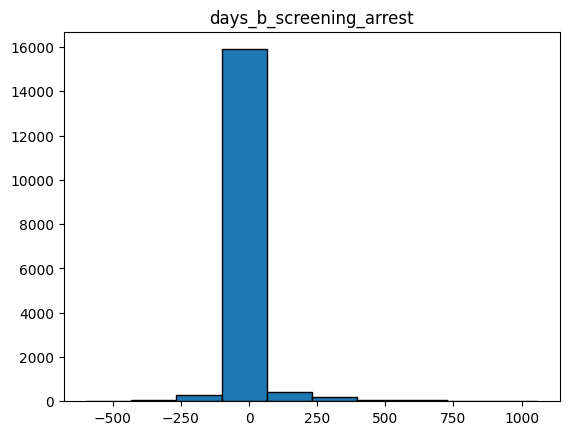

<Figure size 1000x1000 with 0 Axes>

******************* c_days_from_compas **************************


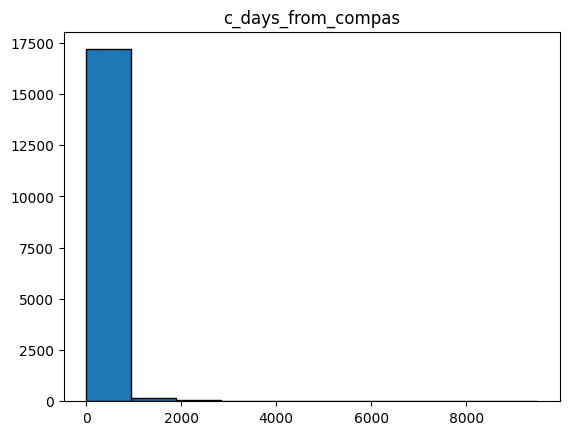

<Figure size 1000x1000 with 0 Axes>

******************* is_recid **************************


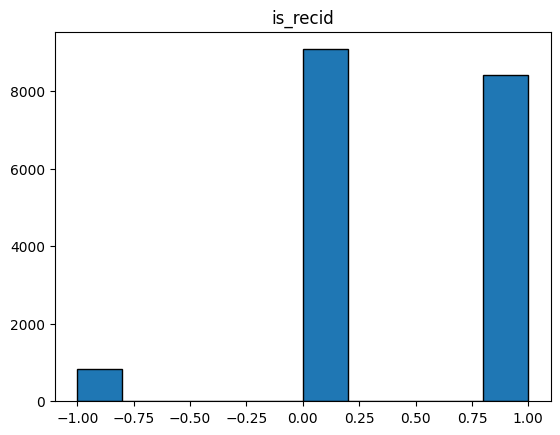

<Figure size 1000x1000 with 0 Axes>

******************* r_days_from_arrest **************************


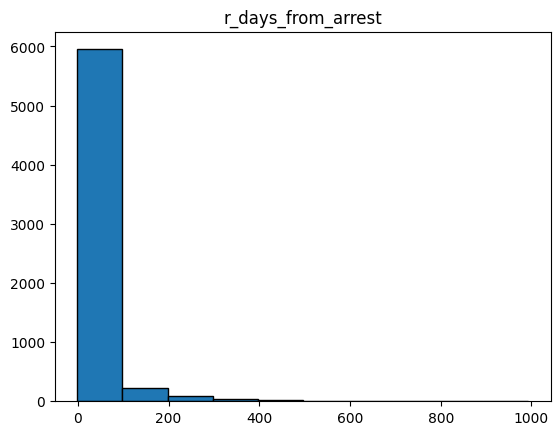

<Figure size 1000x1000 with 0 Axes>

******************* is_violent_recid **************************


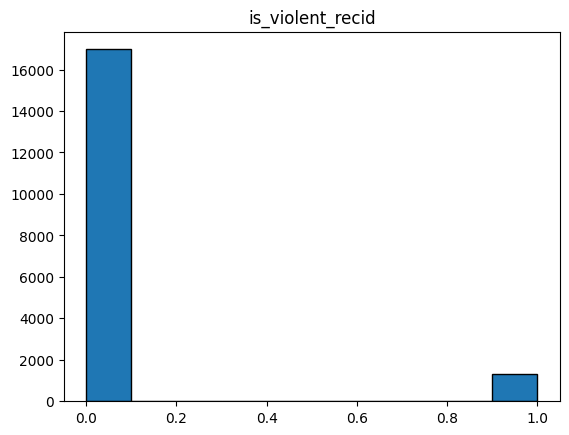

<Figure size 1000x1000 with 0 Axes>

******************* type_of_assessment **************************


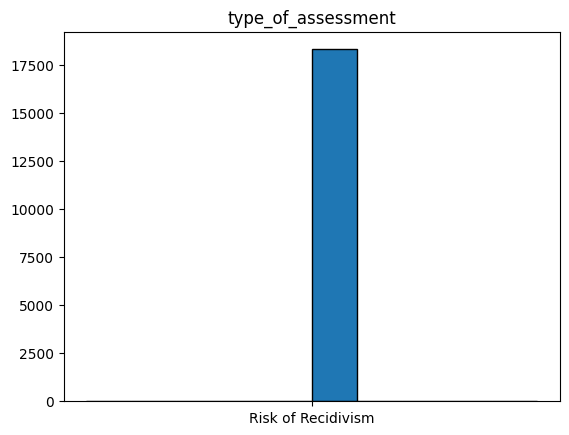

<Figure size 1000x1000 with 0 Axes>

******************* decile_score.1 **************************


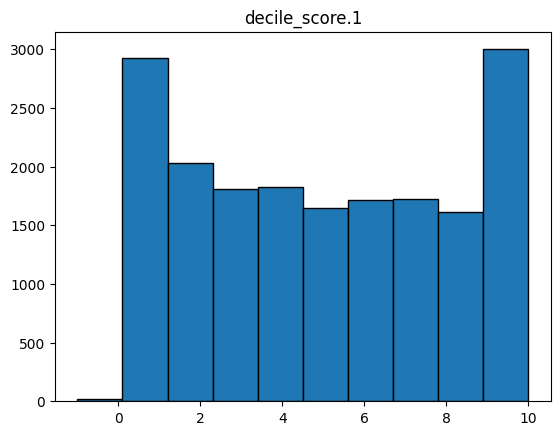

<Figure size 1000x1000 with 0 Axes>

******************* v_type_of_assessment **************************


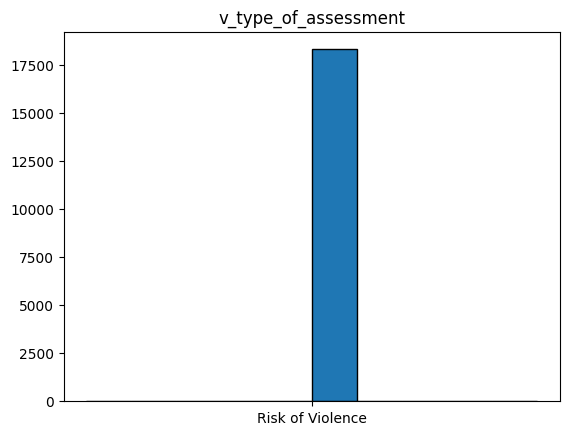

<Figure size 1000x1000 with 0 Axes>

******************* v_decile_score **************************


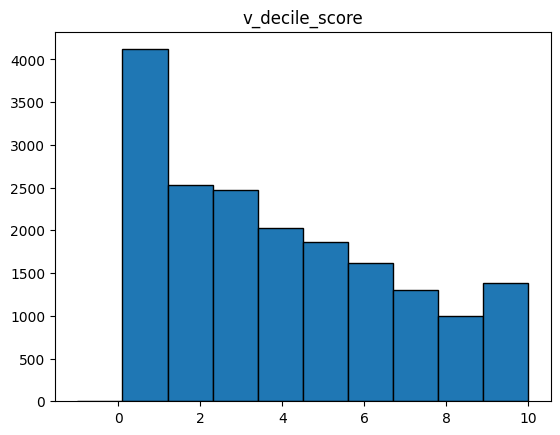

<Figure size 1000x1000 with 0 Axes>

******************* priors_count.1 **************************


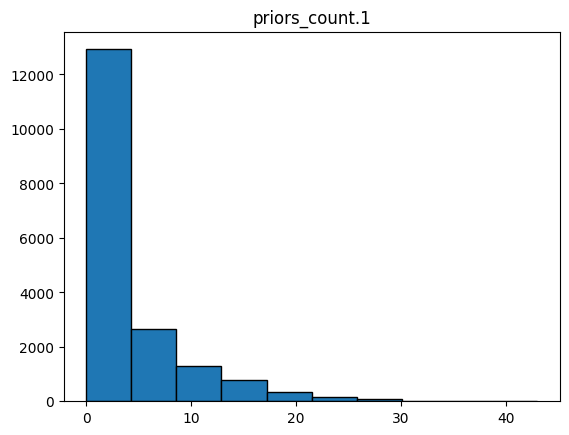

<Figure size 1000x1000 with 0 Axes>

******************* start **************************


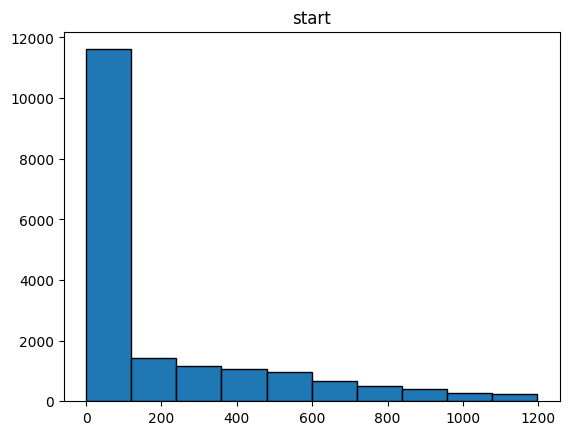

<Figure size 1000x1000 with 0 Axes>

******************* end **************************


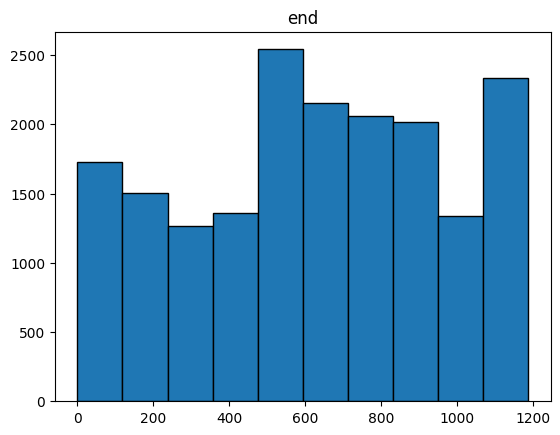

<Figure size 1000x1000 with 0 Axes>

******************* event **************************


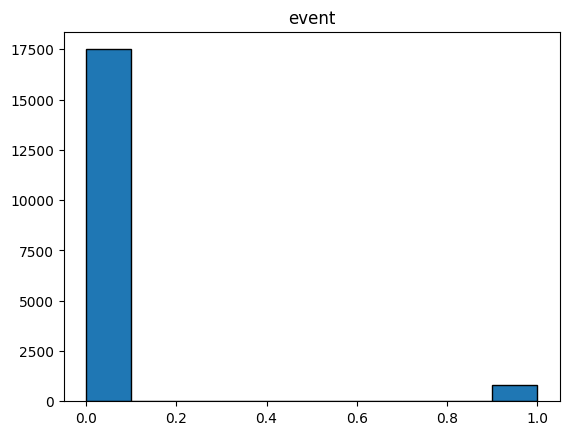

<Figure size 1000x1000 with 0 Axes>

In [ ]:
for col in categorical_columns_data2:
  print("*******************",col,"**************************")
  plt.hist(data2[col], edgecolor='black')
  plt.title(col)
  figure(figsize=(10,10))
  plt.show()

In [ ]:
date_columns2=[]
for i in data2.columns: 
  if "date" in i:
    date_columns2.append(i)

In [ ]:
date_columns2

['compas_screening_date',
 'c_offense_date',
 'c_arrest_date',
 'r_offense_date',
 'vr_offense_date',
 'screening_date',
 'v_screening_date']

In [ ]:
counts = data2.groupby(data2["c_offense_date"].dt.year)["c_offense_date"].value_counts()
trace = go.Histogram(x=data2["c_offense_date"], nbinsx=5)
layout = go.Layout(title='My Histogram', xaxis_title='X Axis Label', yaxis_title='Y Axis Label')
fig = go.Figure(data=[trace], layout=layout)
fig.show()


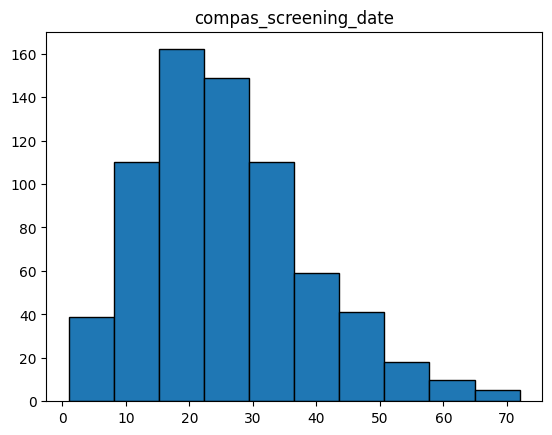

<Figure size 1000x1000 with 0 Axes>

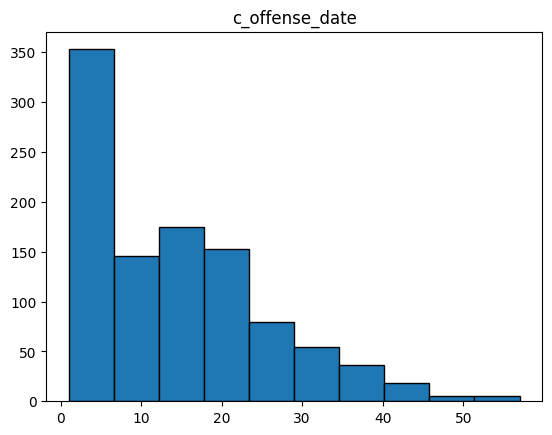

<Figure size 1000x1000 with 0 Axes>

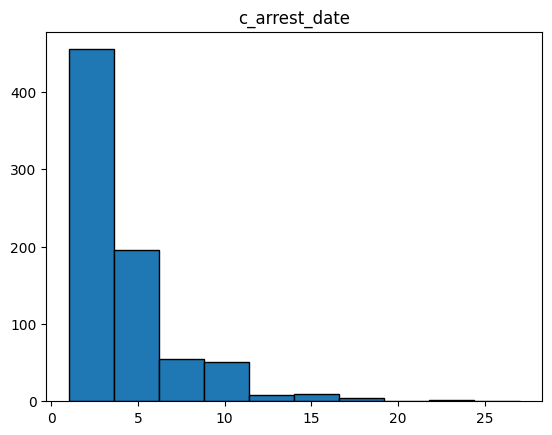

<Figure size 1000x1000 with 0 Axes>

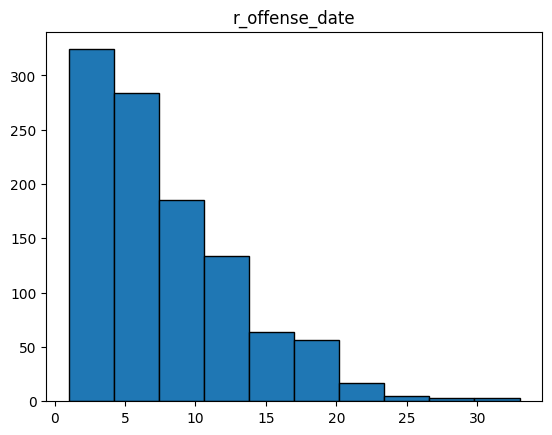

<Figure size 1000x1000 with 0 Axes>

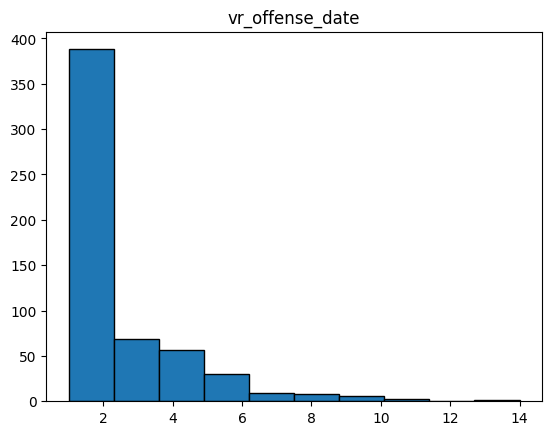

<Figure size 1000x1000 with 0 Axes>

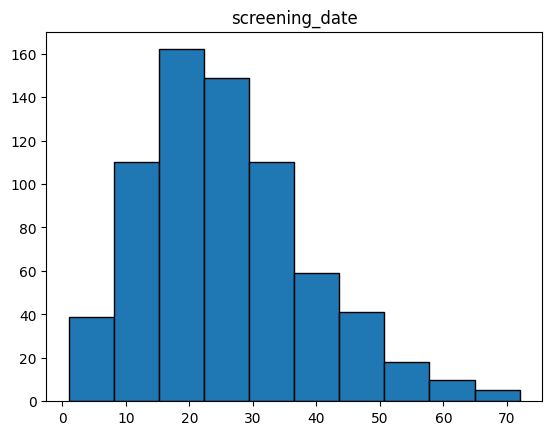

<Figure size 1000x1000 with 0 Axes>

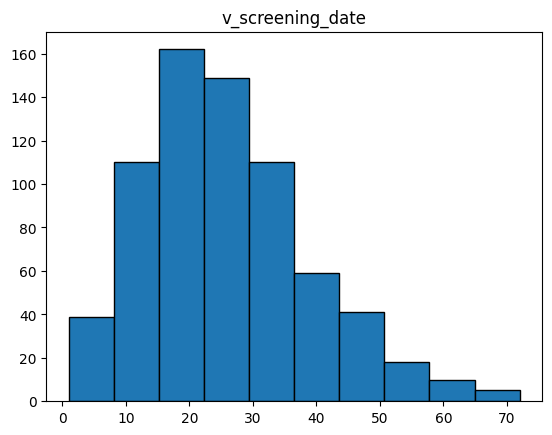

<Figure size 1000x1000 with 0 Axes>

In [ ]:
for d in date_columns2:
  data2[d]= pd.to_datetime(data2[d])
  counts = data2.groupby(data2[d].dt.year)[d].value_counts()
  plt.hist(counts,edgecolor='black')
  plt.title(d)
  figure(figsize=(10,10))
  plt.show()
  #print(d)
  #print(counts)
  #print("**********************")
  #print(data2[d].value_counts())

#### Analayse 3rd dataset

In [ ]:
data3.describe()

,id,age,juv_fel_count,decile_score,juv_misd_count,juv_other_count,priors_count,days_b_screening_arrest,c_days_from_compas,is_recid,r_days_from_arrest,violent_recid,is_violent_recid,decile_score.1,v_decile_score,priors_count.1,event
count,11001.00000,18316.000000,18316.000000,18316.000000,18316.000000,18316.000000,18316.000000,17019.000000,17449.000000,18316.000000,6359.000000,0.0,18316.000000,18316.000000,18316.000000,18316.000000,18316.000000
mean,5501.00000,34.019273,0.076873,4.997052,0.098439,0.124263,3.913191,4.302485,57.694596,0.414774,19.961629,NaN,0.073105,4.997052,4.022822,3.913191,0.044715
std,3175.85949,11.667811,0.464272,2.937569,0.517639,0.524537,5.299864,81.159881,317.994694,0.576449,74.139695,NaN,0.260317,2.937569,2.614189,5.299864,0.206683
min,1.00000,18.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,-597.000000,0.000000,-1.000000,-1.000000,NaN,0.000000,-1.000000,-1.000000,0.000000,0.000000
25%,2751.00000,25.000000,0.000000,2.000000,0.000000,0.000000,0.000000,-1.000000,1.000000,0.000000,0.000000,NaN,0.000000,2.000000,2.000000,0.000000,0.000000
50%,5501.00000,31.000000,0.000000,5.000000,0.000000,0.000000,2.000000,-1.000000,1.000000,0.000000,0.000000,NaN,0.000000,5.000000,4.000000,2.000000,0.000000
75%,8251.00000,41.000000,0.000000,8.000000,0.000000,0.000000,5.000000,0.000000,2.000000,1.000000,1.000000,NaN,0.000000,8.000000,6.000000,5.000000,0.000000
max,11001.00000,96.000000,20.000000,10.000000,13.000000,17.000000,43.000000,1057.000000,9485.000000,1.000000,993.000000,NaN,1.000000,10.000000,10.000000,43.000000,1.000000


In [ ]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18316 entries, 0 to 18315
Data columns (total 40 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       11001 non-null  float64
 1   name                     18316 non-null  object 
 2   first                    18316 non-null  object 
 3   last                     18316 non-null  object 
 4   sex                      18316 non-null  object 
 5   dob                      18316 non-null  object 
 6   age                      18316 non-null  int64  
 7   age_cat                  18316 non-null  object 
 8   race                     18316 non-null  object 
 9   juv_fel_count            18316 non-null  int64  
 10  decile_score             18316 non-null  int64  
 11  juv_misd_count           18316 non-null  int64  
 12  juv_other_count          18316 non-null  int64  
 13  priors_count             18316 non-null  int64  
 14  days_b_screening_arres

#### Analyse 4th dataset

In [ ]:
data4.describe()

,Two_yr_Recidivism,Number_of_Priors,score_factor,Age_Above_FourtyFive,Age_Below_TwentyFive,African_American,Asian,Hispanic,Native_American,Other,Female,Misdemeanor
count,6172.000000,6172.000000,6172.000000,6172.000000,6172.000000,6172.000000,6172.000000,6172.000000,6172.000000,6172.000000,6172.000000,6172.000000
mean,0.455120,3.246436,0.445723,0.209494,0.218244,0.514420,0.005023,0.082469,0.001782,0.055574,0.190376,0.356773
std,0.498022,4.743770,0.497086,0.406981,0.413087,0.499833,0.070698,0.275101,0.042182,0.229115,0.392629,0.479086
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,4.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,38.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
data4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6172 entries, 0 to 6171
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Two_yr_Recidivism     6172 non-null   int64
 1   Number_of_Priors      6172 non-null   int64
 2   score_factor          6172 non-null   int64
 3   Age_Above_FourtyFive  6172 non-null   int64
 4   Age_Below_TwentyFive  6172 non-null   int64
 5   African_American      6172 non-null   int64
 6   Asian                 6172 non-null   int64
 7   Hispanic              6172 non-null   int64
 8   Native_American       6172 non-null   int64
 9   Other                 6172 non-null   int64
 10  Female                6172 non-null   int64
 11  Misdemeanor           6172 non-null   int64
dtypes: int64(12)
memory usage: 578.8 KB


In [ ]:
data4.head(4)

,Two_yr_Recidivism,Number_of_Priors,score_factor,Age_Above_FourtyFive,Age_Below_TwentyFive,African_American,Asian,Hispanic,Native_American,Other,Female,Misdemeanor
0,0,0,0,1,0,0,0,0,0,1,0,0
1,1,0,0,0,0,1,0,0,0,0,0,0
2,1,4,0,0,1,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,1
